# Dynamic Programming - Policy Iteration 

2020 Jérémie Decock

[![My Binder](https://mybinder.org/badge_logo.svg)](https://mybinder.org/v2/gl/jdhp%2Fslides-rl/HEAD?filepath=labs%2Flab_rl4_policy_iteration_answers.ipynb)

[![NbViewer](https://raw.githubusercontent.com/jupyter/design/master/logos/Badges/nbviewer_badge.svg)](https://nbviewer.jupyter.org/urls/gitlab.com/jdhp/slides-rl/-/raw/master/labs/lab_rl4_policy_iteration_answers.ipynb/%3Finline)

[![Local](https://img.shields.io/badge/Local-Save%20As...-blue)](https://gitlab.com/jdhp/slides-rl/-/raw/master/labs/lab_rl4_policy_iteration_answers.ipynb?inline=false)

## Introduction

The purpose of this lab is to introduce some classic concepts used
in reinforcement learning, with the *Policy Iteration* algorithm, one of the two main *Dynamic Programming* methods.
$
\newcommand{\vs}[1]{\mathbf{#1}} % vector symbol (\boldsymbol, \textbf or \vec)
\newcommand{\ms}[1]{\mathbf{#1}} % matrix symbol (\boldsymbol, \textbf)
\def\U{V}
\def\action{\vs{a}}       % action
\def\A{\mathcal{A}}        % TODO
\def\actionset{\mathcal{A}} %%%
\def\discount{\gamma}  % discount factor
\def\state{\vs{s}}         % state
\def\S{\mathcal{S}}         % TODO
\def\stateset{\mathcal{S}}  %%%
%
\def\E{\mathbb{E}}
%\newcommand{transition}{T(s,a,s')}
%\newcommand{transitionfunc}{\mathcal{T}^a_{ss'}}
\newcommand{transitionfunc}{P}
\newcommand{transitionfuncinst}{P(\nextstate|\state,\action)}
\newcommand{transitionfuncpi}{\mathcal{T}^{\pi_i(s)}_{ss'}}
\newcommand{rewardfunc}{r}
\newcommand{rewardfuncinst}{r(\state,\action,\nextstate)}
\newcommand{rewardfuncpi}{r(s,\pi_i(s),s')}
\newcommand{statespace}{\mathcal{S}}
\newcommand{statespaceterm}{\mathcal{S}^F}
\newcommand{statespacefull}{\mathcal{S^+}}
\newcommand{actionspace}{\mathcal{A}}
\newcommand{reward}{R}
\newcommand{statet}{S}
\newcommand{actiont}{A}
%\newcommand{newstatet}{S'}
\newcommand{nextstate}{\state'}
\newcommand{newactiont}{A'}
\newcommand{stepsize}{\alpha}
\newcommand{discount}{\gamma}
\newcommand{qtable}{q_*}
\newcommand{finalstate}{\state_F}
%
\newcommand{\vs}[1]{\boldsymbol{#1}} % vector symbol (\boldsymbol, \textbf or \vec)
\newcommand{\ms}[1]{\boldsymbol{#1}} % matrix symbol (\boldsymbol, \textbf)
\def\vit{Value Iteration}
\def\pit{Policy Iteration}
\def\discount{\gamma}  % discount factor
\def\state{\vs{s}}         % state
\def\S{\mathcal{S}}         % TODO
\def\stateset{\mathcal{S}}  %%%
\def\cstateset{\mathcal{X}} %%%
\def\x{\vs{x}}                    % TODO cstate
\def\cstate{\vs{x}}               %%%
\def\policy{\pi}
\def\piparam{\vs{\theta}}         % TODO pparam
\def\action{\vs{a}}       % action
\def\A{\mathcal{A}}        % TODO
\def\actionset{\mathcal{A}} %%%
\def\caction{\vs{u}}       % action
\def\cactionset{\mathcal{U}} %%%
\def\decision{\vs{d}}       % decision
\def\randvar{\vs{\omega}}       %%%
\def\randset{\Omega}       %%%
\def\transition{T}       %%%
\def\immediatereward{r}    %%%
\def\strategichorizon{s}    %%% % TODO
\def\tacticalhorizon{k}    %%%  % TODO
\def\operationalhorizon{h}    %%%
\def\constalpha{a}    %%%
\def\U{V}              % utility function
\def\valuefunc{V}
\def\X{\mathcal{X}}
\def\meu{Maximum Expected Utility}
\def\finaltime{T}
\def\timeindex{t}
\def\iterationindex{i}
\def\decisionfunc{d}       % action
\def\mdp{\text{MDP}}
$

**Notice**: Here we assume that the reward only depends on the state: $r(\state) \equiv \mathcal{R}(\state, \action, \state')$.

**Notice**: this notebook requires the OpenAI *Gym* library ; you can install it with `pip install gym` (the next cell does this for you if you use the Google Colab environment).

In [1]:
colab_requirements = [
    "matplotlib>=3.1.2",
    "numpy>=1.18.1",
    "nose>=1.3.7",
    "gym=>0.15.4",
]
import sys, subprocess
def run_subprocess_command(cmd):
    # run the command
    process = subprocess.Popen(cmd.split(), stdout=subprocess.PIPE)
    # print the output
    for line in process.stdout:
        print(line.decode().strip())
        
if "google.colab" in sys.modules:
    for i in colab_requirements:
        run_subprocess_command("pip install " + i)

You can uncomment the following cell to install gym in MyBinder or in your local environment (remove only the `#` not the `!`).

In [2]:
#!pip install gym

In [3]:
%matplotlib inline

import matplotlib
import matplotlib.pyplot as plt

import math
import gym
import numpy as np
import copy
import pandas as pd
import seaborn as sns

In [4]:
sns.set_context("talk")

In [5]:
#matplotlib.rcParams['figure.figsize'] = (20.0, 10.0)

## Policy Iteration

*Policy Iteration* **[HOWARD60]** is one of the two main Dynamic Programming algorithms (with *Value Iteration*) used to
compute MDP's optimal policy. In practice, it is often faster than Value Iteration.

The Policy Iteration algorithm alternates the following two steps, starting with an initial policy $\pi_0$:
1. **Policy Evaluation**: given a policy $\pi_i$, compute $\U^{\pi_i}(\state) ~ \forall \state \in \stateset$, the expected value of each state when $\pi_i$ is followed.
2. **Policy Improvement**: compute a new policy $\pi_{i+1}$, using one-step look-ahead based on $\U^{\pi_i}$ and using the principle of *Maximum Expected Utility* as follows
$$
\policy_{\iterationindex+1}(\state) = \arg \max_{\action \in \actionspace} \sum_{\nextstate  \in \statespace} \transitionfuncinst \left( \rewardfuncinst + \discount \valuefunc^{\policy_{\iterationindex}}(\nextstate) \right)
$$

In the following exercise we will assume that the reward only depends on the state: $r(\state) \equiv \mathcal{R}(\state, \action, \state')$.
Thus the *Policy Improvement* can be rewritten as follow:

$$
\pi_{i+1}(\state) = \arg\max_{\action \in \actionset} \sum_{\state' \in \stateset} P(\state' | \state, \action) \U^{\pi_i}(\state')  \label{eq:pi-policy-improvement} \tag{8}
$$

($\rewardfunc$ and $\discount$ can disappear as they have no influence on the $\arg\max_{\action}$ result).

Algorithm 1 describes the two-step procedure.
The algorithm terminates when the *Policy Improvement* step yields no change in the utilities.

___
### Algorithm 1: Policy Iteration

**Input**:<br>
$\quad$ $MDP = \langle \stateset, \actionset, T, r \rangle$, a Markov Decision Process<br>
**Local variables**: <br>
$\quad$ $\U$, vector of utilities for states in $\stateset$, initially zero <br>
$\quad$ $\pi$, a policy vector indexed by state, initially random <br>
<br>
**repeat** <br>
$\quad$ $\valuefunc \leftarrow \text{POLICY-EVALUATION}(\policy, \valuefunc, \mdp)$ <br>
$\quad$ unchanged $\leftarrow$ true <br>
$\quad$ **for all** $\mbox{state} ~ \state \in \stateset$ **do** <br>
$\quad\quad$ **if** $\displaystyle \max_{\action \in \actionset} \left[ \sum_{\state' \in \stateset} \transitionfuncinst \U[\state'] \right] > \sum_{\state' \in \stateset} \transitionfunc(\nextstate | \state, \policy_{\iterationindex}(\state)) \U[\state']$ **then** <br>
$\quad\quad\quad$ $\displaystyle \pi[\state] \leftarrow \arg\max_{\action \in \actionset} \left[ \sum_{\state' \in \stateset} \transitionfuncinst \U[\state'] \right]$ <br>
$\quad\quad\quad$ unchanged $\leftarrow$ false <br>
$\quad\quad$ **end if** <br>
$\quad$ **end for** <br>
**until** unchanged <br>
<br>
**return** $\pi$
___

Solving the POLICY-EVALUATION routine is much simpler than solving the standard
Bellman equations (which is what Value Iteration does).  Indeed, the action in each
state is fixed by the policy, thus the "max" operator disappears and Bellman
equations become linear.
As a result, $\U^{\pi_i}$ can be computed by solving the linear system of these
*simplified Bellman equations* (Eq. \ref{eq:pi-simplified-bellman}) for
each state.

\begin{equation}
    \U^{\pi_i}(\state) = \left\{
    \begin{array}{l l}
        r(\state)               & \quad \text{if $\state$ is a final state} \\
        \displaystyle r(\state) + \discount \sum_{\nextstate \in \statespace} \transitionfunc(\nextstate | \state, \policy_{\iterationindex}(\state)) ~ \valuefunc^{\policy_{\iterationindex}}(\nextstate)     & \quad \text{otherwise}\\
    \end{array} \right.
    \label{eq:pi-simplified-bellman} \tag{9}
\end{equation}

### Convergence

As the number of states and policies is finite, and as the policy is improved
at each iteration, Policy Iteration converges in a finite number of iterations (often
small in practice).
However, within each iteration, solving the
POLICY-EVALUATION routine may cost a lot (its complexity is $O(|\stateset|^3)$).

## Setup the FrozenLake toy problem with OpenAI Gym

For the purpose of focusing on the algorithms, we will use standard environments provided by OpenAI Gym framework.
OpenAI Gym provides controllable environments (https://gym.openai.com/envs/) for research in Reinforcement Learning.
We will use a simple toy problem to illustrate Dynamic Programming algorithms properties.

In this lab, we will try to solve the FrozenLake-v0 environment (https://gym.openai.com/envs/FrozenLake-v0/).
Additional information is available [here](https://github.com/openai/gym/wiki/FrozenLake-v0) and [here](https://github.com/openai/gym/wiki/FrozenLake-v0).

**Notice**: this environment is *fully observable*, thus here the terms (environment) *state* and (agent) *observation* are equivalent.
This is not always the case for example in poker, the agent doesn't know the opponent's cards.

### Get the FrozenLake state space and action space

In [6]:
env = gym.make('FrozenLake-v0')

Possible states in FrozenLake are:

In [7]:
states = list(range(env.observation_space.n))
states

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

Possible actions are:

In [8]:
actions = list(range(env.action_space.n))
actions

[0, 1, 2, 3]

The following dictionary may be used to understand actions:

In [9]:
action_labels = {
    0: "Move Left",
    1: "Move Down",
    2: "Move Right",
    3: "Move Up"
}

### Display functions

The next cells contain functions that can be used to display states, transitions and policies with the FrozenLake environment.

In [10]:
def states_display(state_seq, title=None, figsize=(5,5), annot=True, fmt="0.1f", linewidths=.5, square=True, cbar=False, cmap="Reds"):
    size = int(math.sqrt(len(state_seq)))
    state_array = np.array(state_seq)
    state_array = state_array.reshape(size, size)
    
    fig, ax = plt.subplots(figsize=figsize)         # Sample figsize in inches
    sns.heatmap(state_array, annot=annot, fmt=fmt, linewidths=linewidths, square=square, cbar=cbar, cmap=cmap)
    plt.title(title)
    plt.show()

In [11]:
def transition_display(state, action):
    states_display(transition_array[state,action], title="Transition probabilities for action {} ({}) in state {}".format(action, action_labels[action], state))

In [12]:
def display_policy(policy):
    actions_src = ["{}={}".format(action, action_labels[action].replace("Move ", "")) for action in actions]
    title = "Policy (" + ", ".join(actions_src) + ")"
    states_display(policy, title=title, fmt="d", cbar=False, cmap="Reds")

### Make the `is_final_array`, `reward_array` and `transition_array`

To implement Dynamic Programming algorithms, we need the transition probability (or transition function) and the reward function, both defined in `env.P`.

`env.P[S][A]` gives the list of reachable states from state S executing action A.

These reachable states are coded in a tuple defined like this: `(probability, next state, reward, is_final_state)`.

You will not need to use `env.P` to solve exercises.
In the following cell, `is_final_array`, `reward_array` and `transition_array` are defined for convenience.

In [13]:
is_final_array = np.full(shape=len(states), fill_value=np.nan, dtype=np.bool)
reward_array = np.full(shape=len(states), fill_value=np.NINF)                # np.NINF = negative infinity
transition_array = np.zeros(shape=(len(states), len(actions), len(states)))

for state in states:
    for action in actions:
        for next_state_tuple in env.P[state][action]:              # env.P[state][action] contains the next states list (a list of tuples)
            transition_probability, next_state, next_state_reward, next_state_is_final = next_state_tuple

            is_final_array[next_state] = next_state_is_final
            reward_array[next_state] = max(reward_array[next_state], next_state_reward)   # workaround: when we already are in state 15, reward is 0 if we stay in state 15 (in practice this never append as the simulation stop when we arrive in state 15 as any other terminal state)
            transition_array[state, action, next_state] += transition_probability

In [14]:
def reachable_states(state, action):
    return np.nonzero(transition_array[state, action])[0]

The following plot shows the state corresponding to square of the FrozenLake grid.

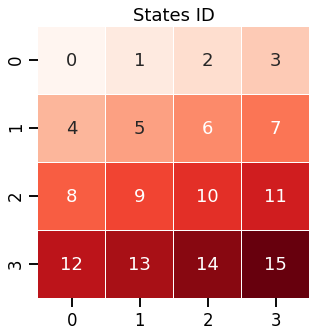

In [15]:
states_display(states, fmt="d", title="States ID")

The following plot shows the reward obtained in each square of the FrozenLake grid.

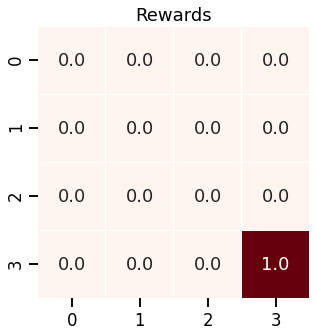

In [16]:
states_display(reward_array, title="Rewards")

The following plot shows whether a square is a final state or not (i.e. whether it ends the simulation or not).

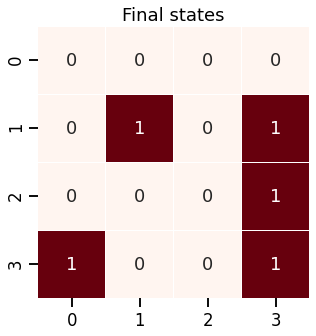

In [17]:
states_display(is_final_array, fmt="d", title="Final states")

The following cells show how to display transitions with the provided `transition_display` function. Figures displayed in squares are the probability to reach these squares from the given (`state`, `action`) pair. Colored squares are the states that may be reached from this pair (a non-zero probability).

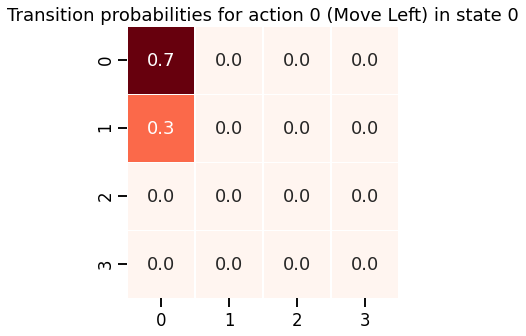

In [18]:
transition_display(state=0, action=0)

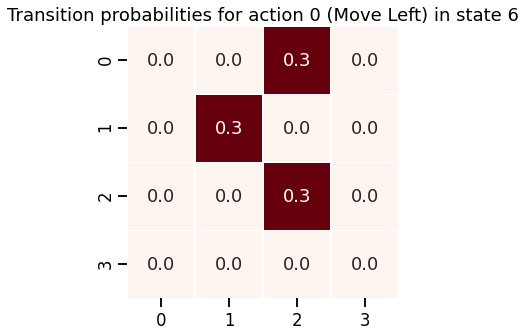

In [19]:
transition_display(state=6, action=0)

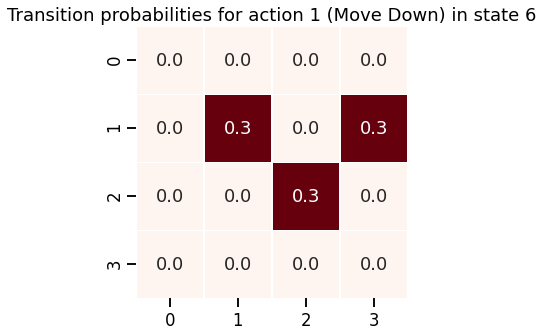

In [20]:
transition_display(state=6, action=1)

## Exercise: Implement the Policy Iteration algorithm

To solve the FrozenLake-v0 problem with Dynamic Programming, we now use the Policy Iteration algorithm described in Algorithm 1.

**Recall**: the FrozenLake-v0 environment is non-deterministic.
To implement Policy Iteration, you will need the transition probability (or the transition function) defined in `transition_array`.
- Use `reachable_states(S, A)` to get the list of reachable states from state `S` executing action `A`(this is not a required function but it may be useful for debugging).
- Use `transition_array[S, A]` to get the probability of reaching each state from state `S` executing action `A`.
- Use `transition_array[S, A, S']` to get the probability of reaching state `S'` from state `S` executing action `A`.

You will also need the previously defined `is_final_array` matrix.
- Use `is_final_array[S]` to know whether `S` is a final state (`True`) or not (`False`).

Finally, you will need the previously defined `reward_array` matrix.
- Use `reward_array[S]` to get the reward obtained by the agent each time it reaches state `S`.

In the following cell, we define `expected_value` and `expected_values` functions for convenience.
The first one returns the expected reward
$$\sum P(\state' | \state, \action) \U(\state')$$
for a given pair $(\state, \action)$ and a given V-table (value function) $\U$.
The second one computes the expected reward for all the actions in $\state$.

In [21]:
def expected_value(state, action, v_array):
    return (transition_array[state, action] * v_array).sum() # compute sum(P(s'|a,s').V(s'))

In [22]:
def expected_values(state, v_array):
    return (transition_array[state] * v_array).sum(axis=1)   # compute sum(P(s'|a,s).V(s')) for all the actions

**Task:** implement Iterative Policy Iteration (described in Algorithm 1). Note that as part of this task you should also implement iterative policy evaluation.

### Question 1: Define the (exact) Policy Evaluation function

In [23]:
def policy_evaluation(policy, gamma):

    ### BEGIN SOLUTION
    A = np.full(shape=(len(states), len(states)), fill_value=np.nan)

    for state in states:
        for next_state in states:
            action = policy[state]
            A[state, next_state] = -gamma * transition_array[state, action, next_state]

            if state == next_state:
                A[state, next_state] = A[state, next_state] + 1.

    x = np.dot(np.linalg.inv(A), reward_array)
    ### END SOLUTION

    return x

### Question 2: Define the greedy policy (Maximum Expected Utility)

In [24]:
def greedy_policy(state, v_array):

    ### BEGIN SOLUTION
    policy = expected_values(state, v_array).argmax()
    ### END SOLUTION

    return policy

### Question 3: Define the Policy Improvement function

In [25]:
def policy_iteration(gamma, initial_policy=None, policy_evaluation_function=policy_evaluation):

    ### BEGIN SOLUTION
    # Set the initial policy
    if initial_policy is not None:
        policy = initial_policy
    else:
        policy = np.random.randint(low=min(actions), high=max(actions), size=len(states), dtype='int')  # Random initial policy

    stop = False
    while not stop:
        print(policy)

        v_array = policy_evaluation_function(policy, gamma)

        new_policy = np.copy(policy)
        for state in states:
            new_policy[state] = greedy_policy(state, v_array)

        if np.array_equal(new_policy, policy):
            stop = True
        else:
            policy = new_policy
    ### END SOLUTION

    return policy

[0 1 1 1 0 0 0 0 1 2 1 2 2 0 1 2]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 2 0]
[0 3 3 3 0 0 0 0 3 1 0 0 0 2 1 0]


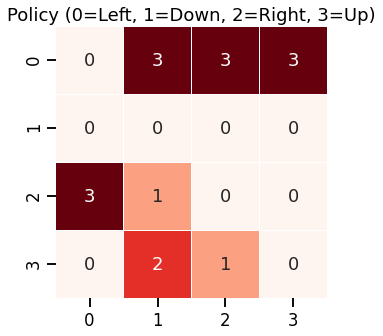

In [26]:
gamma = 0.99

policy = policy_iteration(gamma=gamma, policy_evaluation_function=policy_evaluation)

display_policy(policy)

### Evaluate Policy Iteration with Gym (single trial)

In [27]:
env._max_episode_steps = 1000

In [28]:
reward_list = []

NUM_EPISODES = 1000

for episode_index in range(NUM_EPISODES):
    state = env.reset()
    done = False
    #t = 0

    while not done:
        action = policy[state]      # Take a random action
        state, reward, done, info = env.step(action)
        #t += 1

    reward_list.append(reward)
    #print("Episode finished after {} timesteps ; reward = {}".format(t, reward))

print(sum(reward_list) / NUM_EPISODES)            

env.close()

0.823


### Evaluate Policy Iteration for different $\gamma$ with confidence interval (bootstrap)

In [ ]:
%%time

NUM_EPISODES = 1000

reward_list = []

for gamma in (0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.84, 0.9, 0.95, 0.99):
    print("gamma:", gamma)
    policy = policy_iteration(gamma=gamma)
    
    for episode_index in range(NUM_EPISODES):
        state = env.reset()
        done = False

        while not done:
            action = policy[state]
            state, reward, done, info = env.step(action)

        reward_list.append({"gamma": gamma, "reward": reward})

env.close()

gamma: 0.2
[2 0 1 2 1 1 2 0 1 0 0 2 1 1 0 0]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
[0 1 2 3 0 0 0 0 0 1 0 0 0 1 2 0]
[1 2 2 3 0 0 0 0 1 1 0 0 0 2 1 0]
[1 3 2 3 0 0 0 0 3 1 0 0 0 2 1 0]
gamma: 0.3
[2 0 0 1 1 2 1 2 1 1 2 0 2 0 2 0]
[0 3 2 3 0 0 0 0 3 1 0 0 0 2 2 0]
[1 3 2 3 0 0 0 0 3 1 0 0 0 2 1 0]
gamma: 0.4
[1 0 2 2 0 0 2 0 2 0 1 0 0 2 0 0]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
[0 1 2 3 0 0 0 0 0 1 0 0 0 1 2 0]
[1 2 2 3 0 0 0 0 1 1 0 0 0 2 1 0]
[1 3 2 3 0 0 0 0 3 1 0 0 0 2 1 0]
gamma: 0.5
[2 0 2 2 0 1 2 1 1 1 2 2 1 2 2 2]
[0 3 0 0 0 0 0 0 3 1 0 0 0 2 1 0]
[1 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[1 3 2 3 0 0 0 0 3 1 0 0 0 2 1 0]
gamma: 0.6
[2 1 0 0 1 0 0 1 0 1 0 1 1 2 2 1]
[3 3 2 3 0 0 0 0 1 1 0 0 0 2 1 0]
[1 3 2 3 0 0 0 0 3 1 0 0 0 2 1 0]
gamma: 0.7
[0 2 2 1 0 1 0 1 0 2 2 1 1 1 1 0]
[1 2 0 3 0 0 0 0 1 1 0 0 0 2 1 0]
[0 3 2 3 0 0 0 0 3 1 0 0 0 2 1 0]
[1 3 2 3 0 0 0 0 3 1 0 0 0 2 1 0]
gamma: 0.8
[0 1 1 1 0 1 2 1 2 0 1 2 0 2 0 1]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
[0 1 2 3 0 0 0 0 0 1 0 0 0 1 2 0]
[3 2 

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 2 0 3 1 0 0 0 2 1 0]
[0 3 0 3 0 0 0

In [ ]:
df = pd.DataFrame(reward_list)
df.tail()

### Plot mean reward (with its 95% confidence interval)

In [ ]:
sns.relplot(x="gamma", y="reward", kind="line", data=df, height=6, aspect=1.5)
plt.axhline(0.76, color="red", linestyle=":", label="76% success threshold");   # 76% success threshold
plt.legend();

## References

**[BELLMAN57]** Richard Ernest Bellman. *Dynamic Programming*. Princeton University Press, Princeton,
New Jersey, USA, 1957.

**[HOWARD60]** R.A. Howard. Dynamic Programming and Markov Processes. MIT Press, Cambridge,
Massachusetts, 1960.